1. Download and store 1m/15m/30m/1h closing prices from solid/prospecting exchanges (Binance for now)
2. Feed it to the /modules
3. Store the results (there maybe are some global adjustments needed in order to lay down approptiate structure).
4. Build live running order exec
* think about volatility filter in further steps

In [38]:
# maybe I should ommit the vectorised backtester and go with iterative straight away?

In [10]:
# CONFIG
report_dir = "TEST_2023_1_REPORT"
ticker_intervals = ["1h"] #["30m", "15m", "1m"]

In [2]:
%load_ext autoreload
import os, sys
parent_dir = os.path.abspath('..')
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

from modules.CointAnalyzer import Coint_Analyzer
from modules.IterativeBacktester import IterativeBacktester



<h2 style="color:yellow;">CORR_COINT ANALYSIS</h2>

In [3]:
%autoreload
coint_analyzer = Coint_Analyzer(
  raw_data_path="../raw_data/BINANCE_DOWNLOADER_TESTS_2023/",
  closing_prices_container_paths=[
            "binance_historical_1h_FUTURES_f77871b1-b133-4991-a1cf-403de08ca07e"],
  processed_data_path="../processed_data/ANALYZER_TEST/",
  interval="1h",
  days_filter=380,
  corr_filter=0.95,
  # cache_path="../processed_data/ANALYZER_TEST/CACHE_TESTS/coint_anal_cache_1h_244f32bd-dcca-484c-9b59-875a132d3dbd.csv"
)

In [9]:
coint_analyzer.df.to_csv("../processed_data/closing_prices_binance_futures_09_07_2023.csv")

In [10]:
coint_analyzer.generate_co_matrices(vanilla_kalman=True, raw_spread=False, create_cache=True, save_spreads=True)

STARTING ANALYSIS
Performing coint test 0 926
hurst -0.014216273605156038
half_life 1
SAVING SPREAD
Performing coint test 1 926
Performing coint test 2 926
Performing coint test 3 926
hurst -0.021687357422528208
half_life 1
SAVING SPREAD
Performing coint test 4 926
Performing coint test 5 926
Performing coint test 6 926
Performing coint test 7 926
Performing coint test 8 926
Performing coint test 9 926
Performing coint test 10 926
Performing coint test 11 926
Performing coint test 12 926
Performing coint test 13 926
Performing coint test 14 926
Performing coint test 15 926
Performing coint test 16 926
Performing coint test 17 926
Performing coint test 18 926
Performing coint test 19 926
Performing coint test 20 926
Performing coint test 21 926
Performing coint test 22 926
Performing coint test 23 926
Performing coint test 24 926
Performing coint test 25 926
Performing coint test 26 926
Performing coint test 27 926
Performing coint test 28 926
Performing coint test 29 926
Performing coi

<Figure size 864x576 with 0 Axes>

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [ ]:
pair="VETUSDT_FUTURES-NEOUSDT_FUTURES".split("-")
historical_dir_path = "../raw_data/BINANCE_DOWNLOADER_TESTS/binance_historical_1h_FUTURES_e9ed8343-70ff-45c9-b262-69de65bbf28b/"
df_closings = pd.DataFrame()

for instrument in pair:
  df = pd.read_csv('%s%s_1h.csv' % (historical_dir_path, instrument),
                             index_col="Date", parse_dates=["Date"])
  df = df[["Close"]].copy()
  df.columns = [instrument]
  df["%s_returns" % instrument] = df[instrument] / \
                df[instrument].shift(1) - 1
  df_closings = pd.concat([df_closings, df], axis=1)

df_closings.dropna(inplace=True)
df_closings = df_closings.T.drop_duplicates().T
df_closings = df_closings.loc["2021-03-01 00:00:00":]
df_closings
# df_closings.loc["2021-03-01 00:00:00"]


# df_sp = pd.read_csv("../processed_data/ANALYZER_TEST/coint_pairs_1h_58cda278-c6f3-4659-bcbc-d2fc8af82bde/ADAUSDT_FUTURES_ADABUSD_FUTURES_spread.csv", index_col=0)

In [4]:
inst_1 = pair[0]
inst_2 = pair[1]

NameError: name 'pair' is not defined

<h2 style="color:yellow;">ITERATIVE BACKETESTING</h2>

In [19]:
%autoreload

backtester = IterativeBacktester(
  pair="LINKUSDT_FUTURES-ALGOUSDT_FUTURES".split("-"),
  ticker_interval="1h",
  raw_data_path="../raw_data/BINANCE_DOWNLOADER_TESTS_2023/binance_historical_1h_FUTURES_f77871b1-b133-4991-a1cf-403de08ca07e",
  save_dir_path="../processed_data/BACKTESTER_TEST/",
  tc=0.0006
)

<h2 style="color: yellow">BIN<h2>

In [14]:
import numpy as np
import pandas as pd
from itertools import product

 125 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 126 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 127 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 128 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 129 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 130 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 131 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 132 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 133 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 134 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 135 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 136 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 137 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 138 / 26699

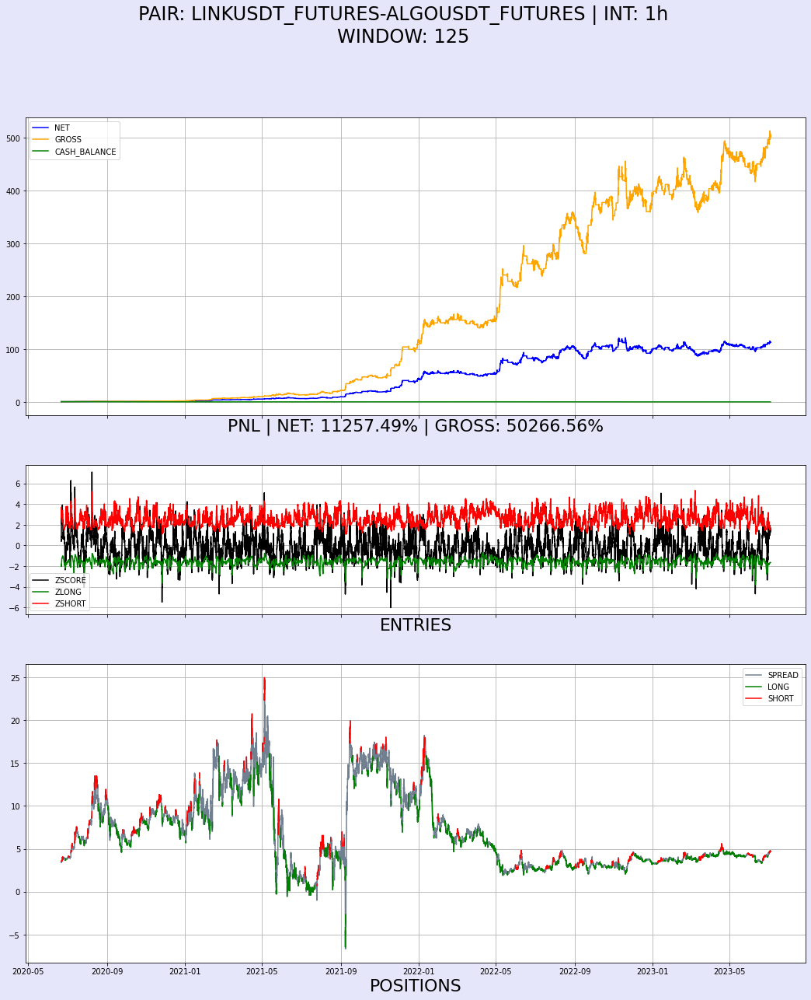

In [22]:
backtester.backtest_pair(
  z_long_perc=2,
  z_short_perc=99,
  tp=0.02,
  sl=-0.04,
  charts=True,
  silent=False,
  window=125,
  # start_date="2021-03-01 00:00:00",
  initial_balance=1000,
  # use_raw_spread=True,
  # use_pykalman=True
  # stationarity_testing=True,
)

In [ ]:
backtester.result.net_cum.plot(figsize=(24,16))
(backtester.result.curr_balance/1000).plot()
(backtester.result.signals/2+1).plot()

In [23]:
backtester.result

,LINKUSDT_FUTURES_position,ALGOUSDT_FUTURES_position,signals,spread,hedge_ratio,zscore,z_long,z_short,gross_returns,net_returns,gross_cum,net_cum,curr_balance
Date,,,,,,,,,,,,,
2020-06-21 16:00:00,0.0,0.0,0.0,3.405444,-3.288757,0.586356,-1.877561,3.311681,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 17:00:00,0.0,0.0,0.0,3.402290,-3.289417,0.528846,-1.917943,3.696464,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 18:00:00,0.0,0.0,0.0,3.395030,-3.290250,0.383648,-1.913399,3.387852,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 19:00:00,0.0,0.0,0.0,3.410896,-3.291042,0.669677,-1.955228,2.782538,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 20:00:00,0.0,0.0,0.0,3.412062,-3.291794,0.702775,-2.029678,3.546501,0.000000,0.000000,1.000000,1.000000,1000.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-03 17:00:00,1.0,-1.0,-1.0,5.922035,-5.454266,1.463983,-1.644986,1.588976,0.004917,0.004917,505.423960,113.971437,671.773506
2023-07-03 18:00:00,1.0,-1.0,-1.0,5.956152,-5.458354,1.596816,-1.641750,1.573604,-0.000426,-0.000426,505.208778,113.922914,671.773506
2023-07-03 19:00:00,1.0,-1.0,-1.0,5.964238,-5.462691,1.606347,-1.635534,1.562327,0.003409,0.003409,506.931091,114.311290,671.773506


<h2>OPTIMIZATION</h2>

0 / 9
1 / 9
2 / 9
3 / 9
4 / 9
5 / 9
6 / 9
7 / 9
8 / 9


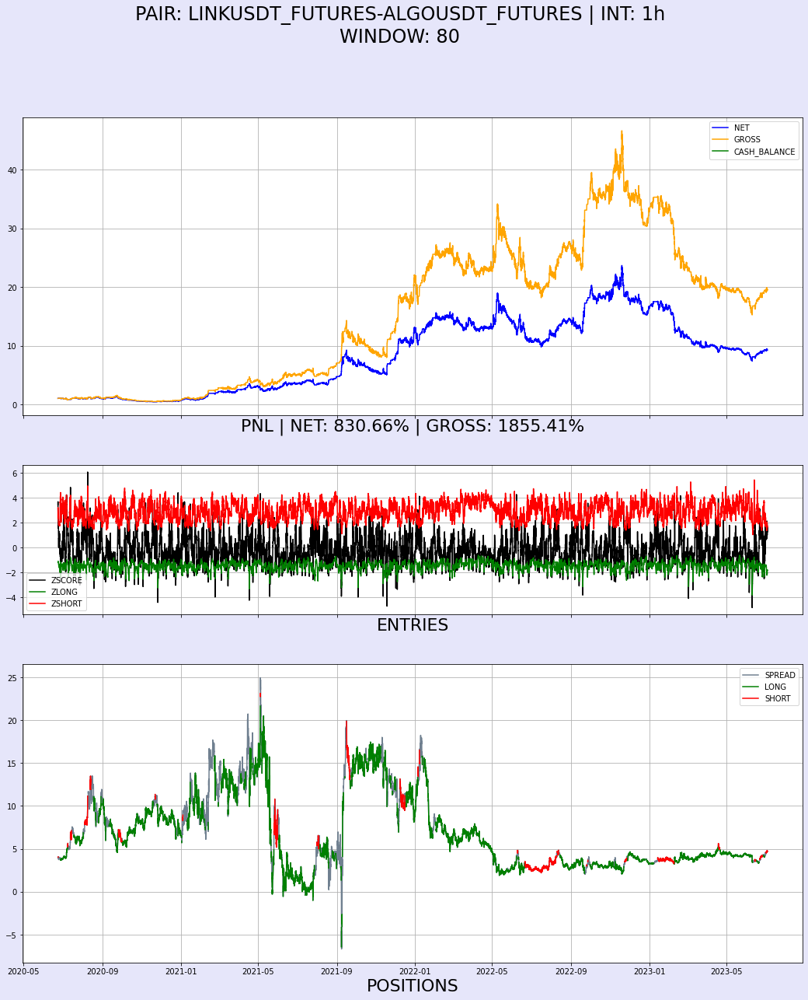

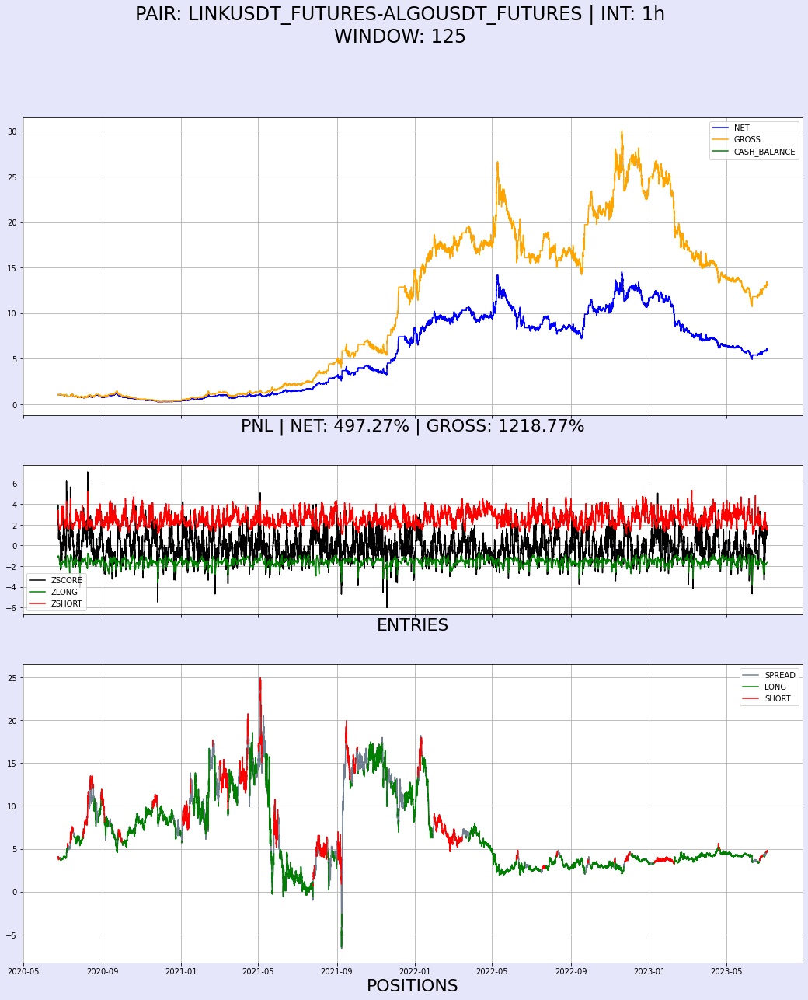

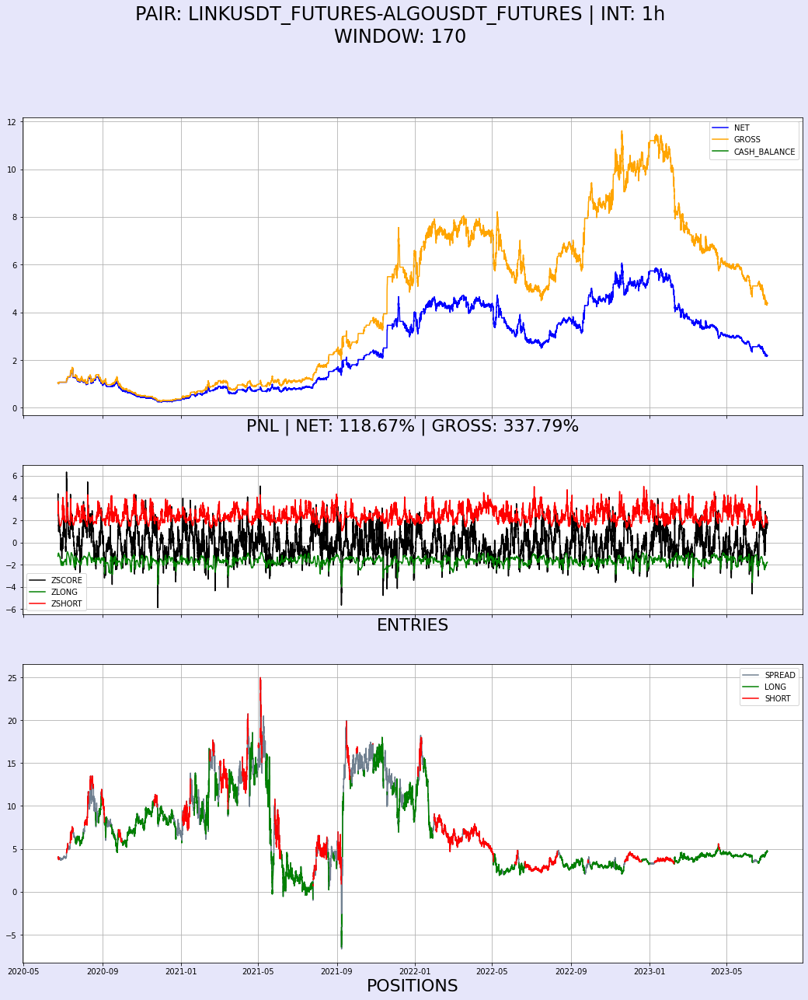

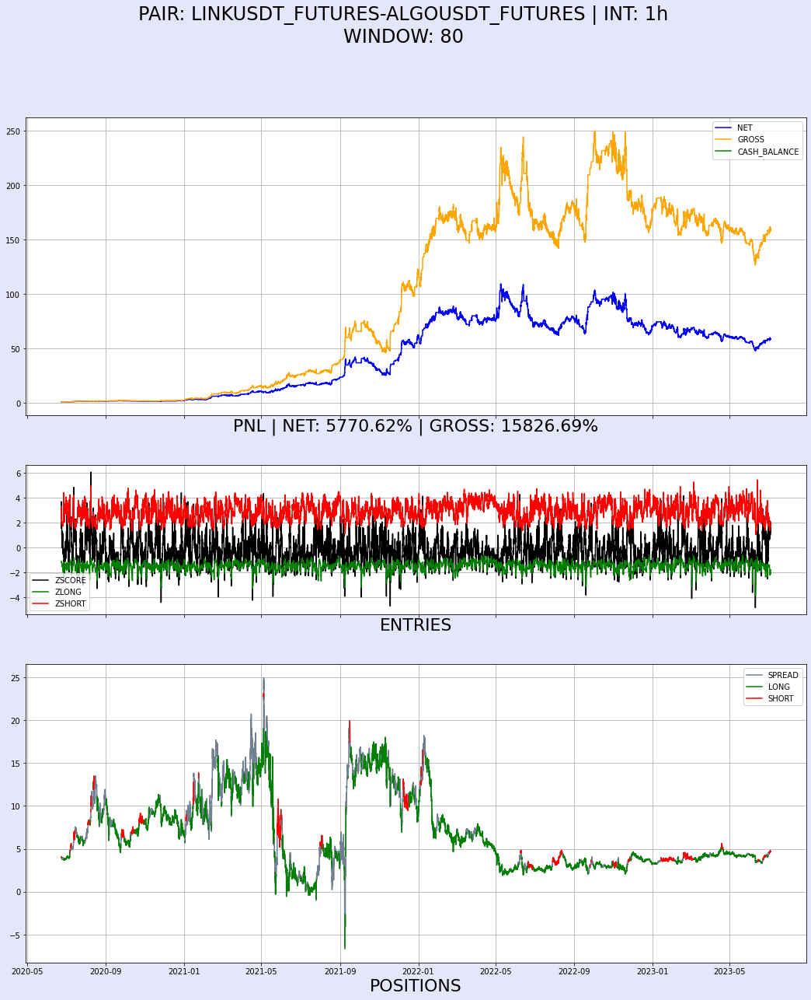

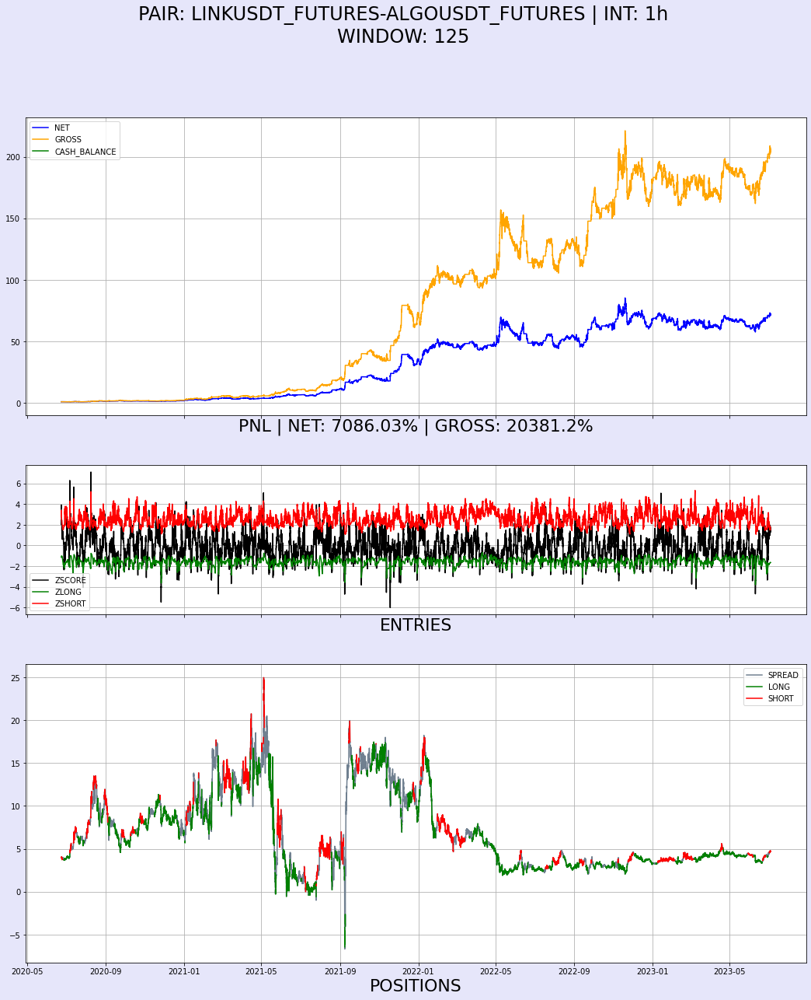

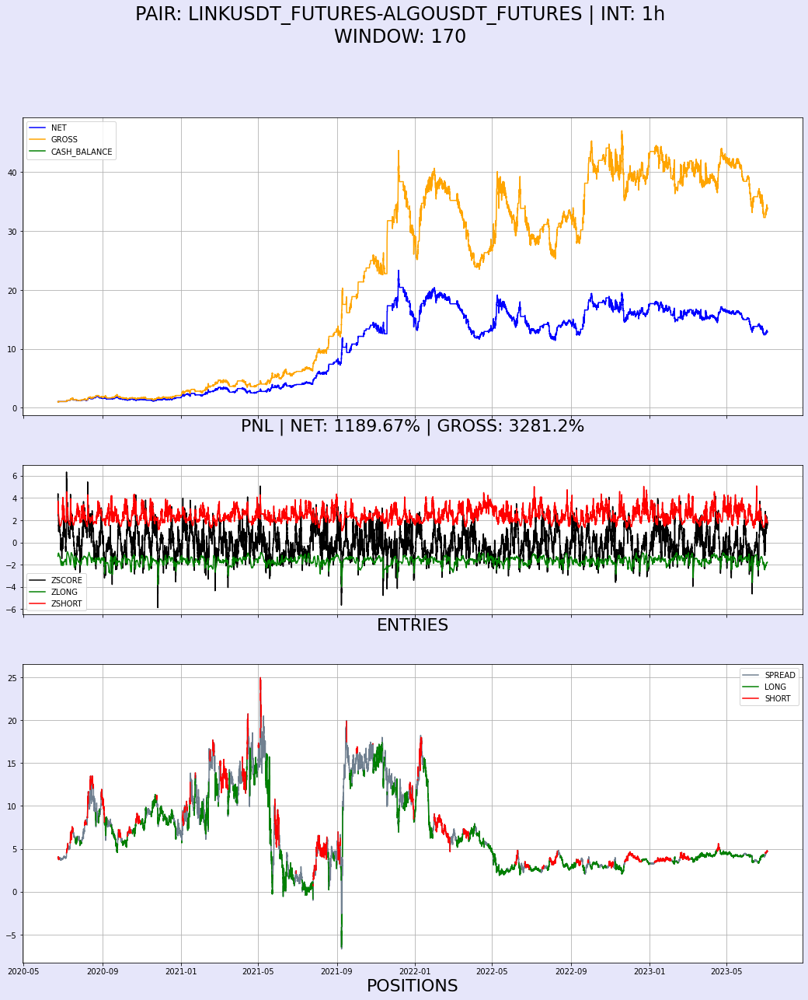

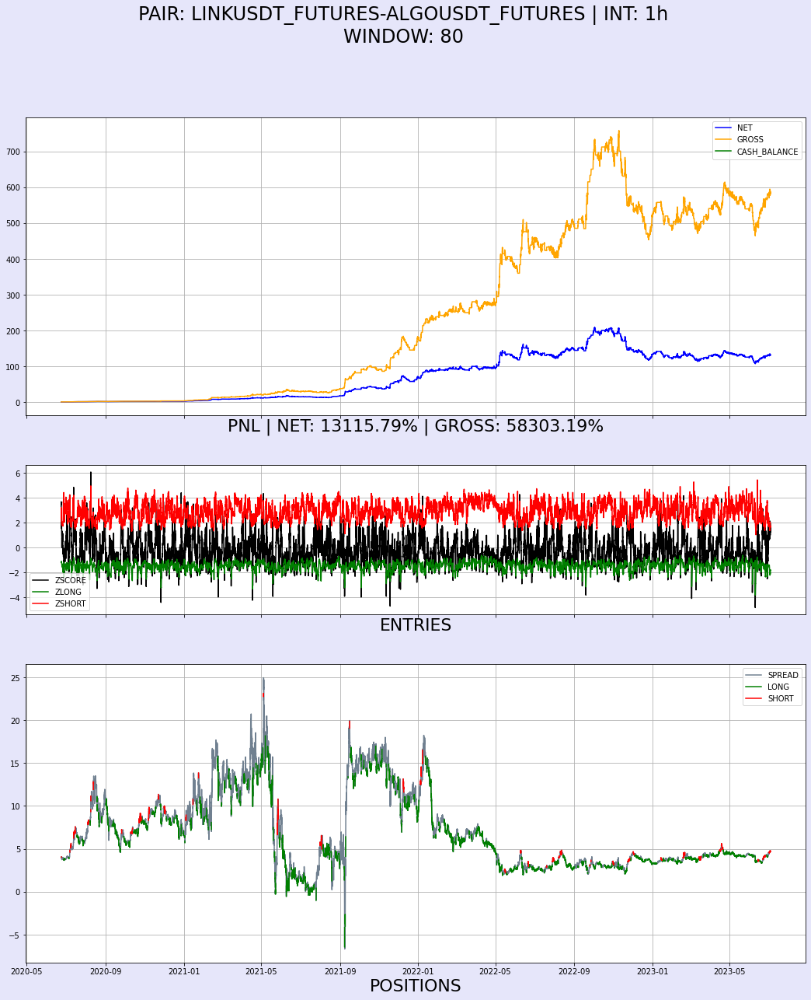

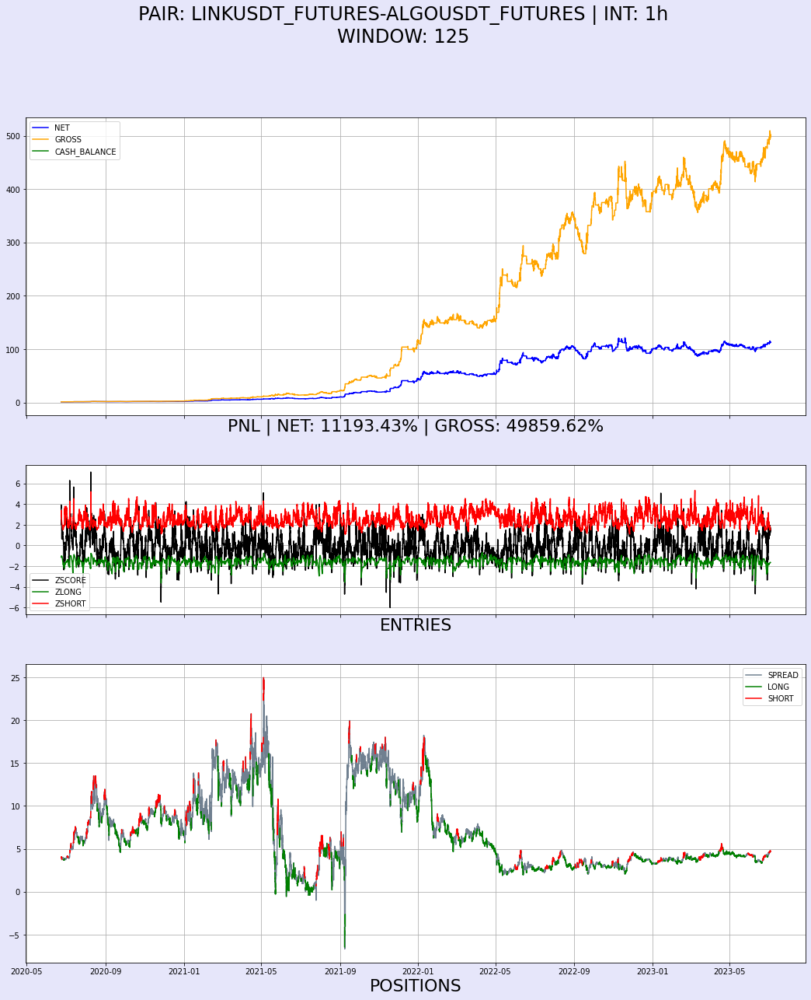

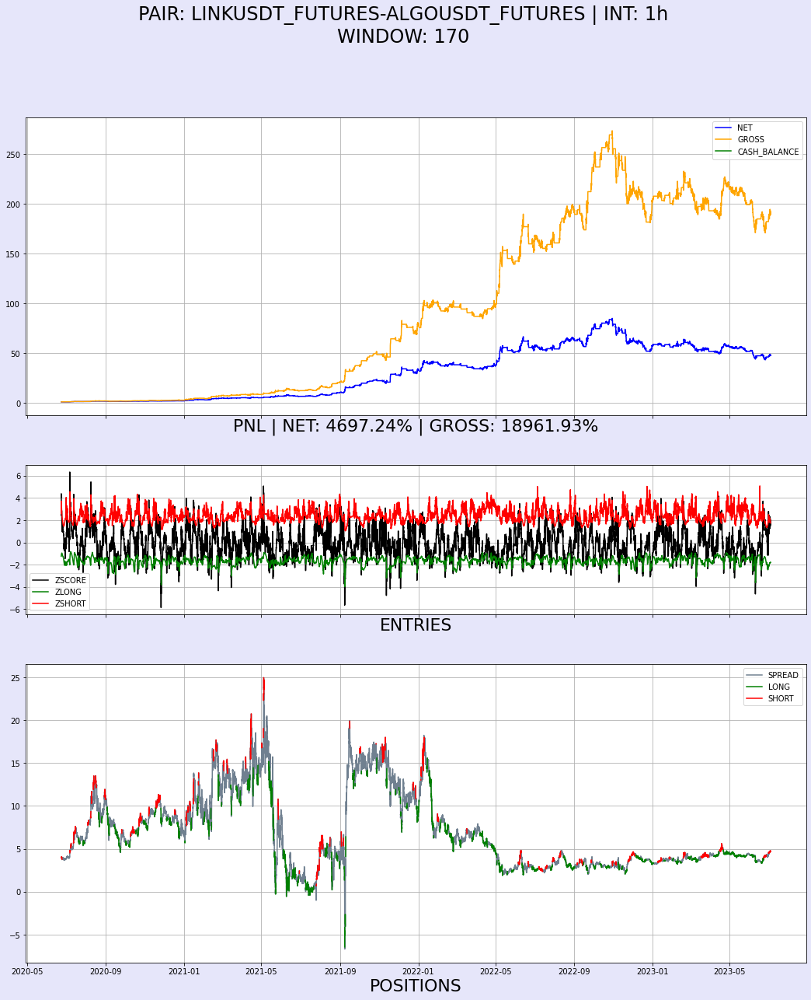

In [20]:
backtester.optimize_pair(
  windows_range=(80, 200, 45),
  short_entries_range=(99,100,1),
  long_entries_range=(2, 3, 1),
  sl_range=(-0.20, -0.03, 0.08),
  tp_range=(0.02, 0.03, 0.01),
  # initial_balance=1000,
  report=True,
  charts=True,
  cache_process=True,
  # cache_path="../processed_data/BACKTESTER_TEST/ENJUSDT_FUTURES_ZENUSDT_FUTURES_30m/ENJUSDT_FUTURES_ZENUSDT_FUTURES_optimization_overview_cache.csv"
)

In [21]:
backtester.opt_overview

,le,se,sl,tp,window,net,max_dd
2_99_-0.2_0.02_170,2.0,99.0,-0.20,0.02,170.0,2.187,-0.555
2_99_-0.2_0.02_125,2.0,99.0,-0.20,0.02,125.0,5.973,-0.618
2_99_-0.2_0.02_80,2.0,99.0,-0.20,0.02,80.0,9.307,-0.660
2_99_-0.12_0.02_170,2.0,99.0,-0.12,0.02,170.0,12.897,-0.490
2_99_-0.04_0.02_170,2.0,99.0,-0.04,0.02,170.0,47.972,-0.485
2_99_-0.12_0.02_80,2.0,99.0,-0.12,0.02,80.0,58.706,-0.559
2_99_-0.12_0.02_125,2.0,99.0,-0.12,0.02,125.0,71.860,-0.361
2_99_-0.04_0.02_125,2.0,99.0,-0.04,0.02,125.0,112.934,-0.285
2_99_-0.04_0.02_80,2.0,99.0,-0.04,0.02,80.0,132.158,-0.484


In [45]:

backtester.result

,AVAXUSDT_FUTURES_position,DOTBUSD_FUTURES_position,signals,spread,hedge_ratio,zscore,z_long,z_short,gross_returns,net_returns,gross_cum,net_cum,curr_balance
Date,,,,,,,,,,,,,
2022-06-11 12:00:00,0.0,0.0,0.0,1.916673,-2.321618,-1.387187,-1.927581,1.839692,0.000000,0.000000,1.000000,1.000000,1.000000e+03
2022-06-11 13:00:00,0.0,0.0,0.0,2.046400,-2.319013,-0.860300,-1.932122,1.950248,0.000000,0.000000,1.000000,1.000000,1.000000e+03
2022-06-11 14:00:00,0.0,0.0,0.0,1.772702,-2.314721,-1.898925,-1.918151,1.982794,0.000000,0.000000,1.000000,1.000000,1.000000e+03
2022-06-11 15:00:00,-1.0,1.0,1.0,1.494598,-2.308557,-2.832696,-1.827111,1.955756,0.015915,0.014715,1.015915,1.014715,7.000500e+03
2022-06-11 16:00:00,-1.0,1.0,1.0,1.541614,-2.302587,-2.533800,-2.042892,1.975607,0.001216,0.001216,1.017150,1.015949,7.000500e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-03 17:00:00,0.0,0.0,0.0,2.153186,-2.076888,0.292112,-2.565030,2.485202,0.000000,0.000000,5.843991,4.863949,1.845124e+07
2023-07-03 18:00:00,0.0,0.0,0.0,2.298865,-2.078641,1.263063,-2.408133,2.445629,0.000000,0.000000,5.843991,4.863949,1.845124e+07
2023-07-03 19:00:00,0.0,0.0,0.0,2.254327,-2.080059,0.944765,-2.254495,2.498599,0.000000,0.000000,5.843991,4.863949,1.845124e+07


In [ ]:
backtester.data.iloc[10].loc['COTIUSDT_FUTURES']

0.42623

In [ ]:
backtester.data.loc["2021-03-10 10:00:00", "COTIUSDT_FUTURES"]

0.45803

In [ ]:
df = backtester.result.copy()
pair=backtester.pair
inst1 = pair[0]
inst2 = pair[1]

In [ ]:
df['dailyret'] = (backtester.data['%s_logs' % inst1]* -df['signals'].shift(1)) + (backtester.data['%s_logs' % inst2]*df['signals'].shift(1))
df['gross'] = df['dailyret'].cumsum().apply(np.exp)

df['trades'] = df.signals.diff().fillna(0).abs()*2
dailyret_net = df['dailyret'] - df['trades']*backtester.tc
df['net'] = dailyret_net.cumsum().apply(np.exp)

In [ ]:
df

,1INCHUSDT_FUTURES_position,COTIUSDT_FUTURES_position,signals,spread,hedge_ratio,zscore,z_long,z_short,gross_returns,net_returns,gross_cum,net_cum,dailyret,gross,trades,net
Date,,,,,,,,,,,,,,,,
2021-10-01 01:00:00,0.0,0.0,0.0,1.495113,-1.868421,-1.121303,-1.810425,1.830513,0.0,0.0,1.000000,1.000000,NaN,NaN,0.0,NaN
2021-10-01 02:00:00,0.0,0.0,0.0,1.456756,-1.867907,-1.196210,-1.806710,1.840315,0.0,0.0,1.000000,1.000000,0.0,1.00000,0.0,1.000000
2021-10-01 03:00:00,0.0,0.0,0.0,1.468483,-1.867363,-1.168798,-1.803183,1.842480,0.0,0.0,1.000000,1.000000,0.0,1.00000,0.0,1.000000
2021-10-01 04:00:00,0.0,0.0,0.0,1.468495,-1.866853,-1.165363,-1.799665,1.844599,0.0,0.0,1.000000,1.000000,0.0,1.00000,0.0,1.000000
2021-10-01 05:00:00,0.0,0.0,0.0,1.502803,-1.866526,-1.092014,-1.796503,1.838938,0.0,0.0,1.000000,1.000000,-0.0,1.00000,0.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-19 10:00:00,0.0,0.0,0.0,0.490875,-0.527193,-0.972367,-1.765557,1.895800,0.0,0.0,0.935355,0.887333,0.0,1.03786,0.0,0.984482
2022-11-19 11:00:00,0.0,0.0,0.0,0.493534,-0.527321,-0.902464,-1.764358,1.895620,0.0,0.0,0.935355,0.887333,0.0,1.03786,0.0,0.984482
2022-11-19 12:00:00,0.0,0.0,0.0,0.493072,-0.527457,-0.913237,-1.763154,1.895385,0.0,0.0,0.935355,0.887333,0.0,1.03786,0.0,0.984482
